In [1]:
pip install igraph

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# use this code in the anaconda prompt, not in jupyter notebook
#conda install -c conda-forge python-annoy
#pip install bbknn

^C


In [2]:
pip install gseapy

     |████████████████████████████████| 1.5 MB 1.7 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 964 kB 3.4 MB/s eta 0:00:01
  Using cached grequests-0.6.0-py3-none-any.whl (5.2 kB)
     |████████████████████████████████| 47 kB 5.2 MB/s eta 0:00:01
  Using cached easydev-0.12.0-py3-none-any.whl
     |████████████████████████████████| 4.6 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 144 kB 4.9 MB/s eta 0:00:01
  Using cached appdirs-1.4.4-py2.py3-none-any.whl (9.6 kB)
  Using cached gevent-21.12.0-cp38-cp38-macosx_10_14_x86_64.whl (1.9 MB)
  Using cached zope.interface-5.4.0-cp38-cp38-macosx_10_14_x86_64.whl (208 kB)
     |████████████████████████████████| 93 kB 2.1 MB/s eta 0:00:011
  Using cached zope.event-4.5.0-py2.py3-none-any.whl (6.8 kB)
  Using cached url_normalize-1.4.3-py2.py3-none-any.whl (6.8 kB)
  ERROR: Command errored 

Note: you may need to restart the kernel to use updated packages.


In [2]:
import bbknn

In [3]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.5 (python 3.8.16) on 2023-05-10 14:59.


In [4]:
import seaborn as sns
import matplotlib as mpl
import plotly.graph_objects as go
#from pySankey.sankey import sankey
#import holoviews as hv

In [5]:
sns.set_style('whitegrid')

In [6]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.5


In [7]:
import os
os.chdir('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4')

In [8]:
import scanpy.external as sce

In [9]:
# all immune cells

adata_immn = sc.read('Group_ABC_after_celltype_clustering_Myel_Tcell_group_added.h5ad')

In [10]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_immn.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_immn.obs.patient).isin(cell_dict[i])
    adata_immn.obs.loc[ind,'Myeloid_to_T_cluster44'] = i

In [11]:
adata_F = adata_immn[adata_immn.obs['crude'].isin(['B cell'])]

In [12]:
adata_F

View of AnnData object with n_obs × n_vars = 18437 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0

In [13]:
pd.crosstab(adata_F.obs['Myeloid_to_T_cluster44'], adata_F.obs['Myeloid_to_T_cluster44'])

Myeloid_to_T_cluster44,M1toT1,M1toT2,M1toT4,M2toT1,M2toT3,M3toT1,M3toT2,M3toT4,M4toT1,M4toT2,M4toT4
Myeloid_to_T_cluster44,,,,,,,,,,,
M1toT1,808,0,0,0,0,0,0,0,0,0,0
M1toT2,0,1532,0,0,0,0,0,0,0,0,0
M1toT4,0,0,611,0,0,0,0,0,0,0,0
M2toT1,0,0,0,265,0,0,0,0,0,0,0
M2toT3,0,0,0,0,4196,0,0,0,0,0,0
M3toT1,0,0,0,0,0,2783,0,0,0,0,0
M3toT2,0,0,0,0,0,0,4607,0,0,0,0
M3toT4,0,0,0,0,0,0,0,758,0,0,0
M4toT1,0,0,0,0,0,0,0,0,1031,0,0


In [14]:
adata_F.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,n_counts,celltype,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44
ACTGTCCTCCTTGACC-1-0-0,736.0,723,989.930542,28.089190,2.837491,tumor,P686,15,0,111.967453,...,989.930542,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3
CCTTCCCTCAGCACAT-1-0-0,387.0,383,760.317261,7.139949,0.939075,tumor,P686,15,0,203.326874,...,760.317261,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3
CGACTTCTCCTCGCAT-1-0-0,617.0,611,948.084106,26.889112,2.836153,tumor,P686,15,0,92.150139,...,948.084106,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3
GGTGCGTTCTGAGTGT-1-0-0,801.0,790,1068.575562,16.854071,1.577247,tumor,P686,15,0,127.007507,...,1068.575562,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3
CGCTATCCACCGATAT-1-1-0,511.0,499,784.279907,27.919434,3.559881,tumor,P658,15,0,145.817093,...,784.279907,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTGTCAT-1-24-2,2287.0,2228,1625.009888,20.684313,1.272873,tumor,P001,3,2,189.416702,...,1625.009888,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1
TTGAACGGTACAGTTC-1-24-2,961.0,930,1258.517090,23.169865,1.841045,tumor,P001,3,2,184.791702,...,1258.517090,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1
TTGACTTAGCAGACTG-1-24-2,2042.0,1985,1498.537842,30.164787,2.012948,tumor,P001,3,2,207.026703,...,1498.537842,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1
TTTACTGCAGGTGGAT-1-24-2,1790.0,1748,1410.335449,19.716057,1.397969,tumor,P001,3,2,202.613861,...,1410.335449,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1


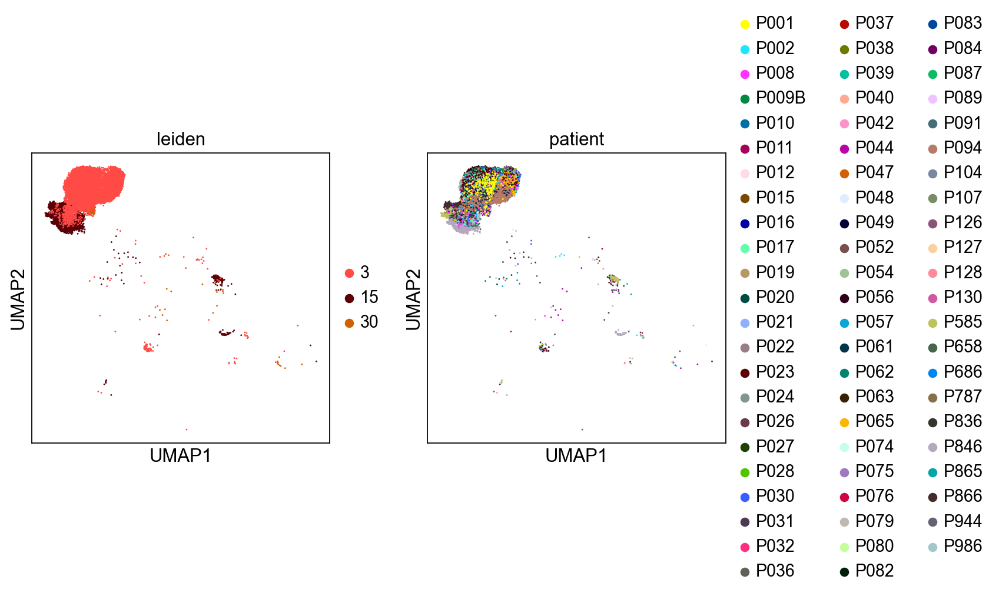

In [15]:
sc.pl.umap(adata_F, color=['leiden','patient'])

In [16]:
adata_F.write('B_cell_before_harmony.h5ad', compression='gzip')

In [17]:
adata_F = sc.read('B_cell_before_harmony.h5ad')

In [18]:
adata_F

AnnData object with n_obs × n_vars = 18437 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_ce

In [19]:
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#adata = adata[:, adata.var.highly_variable]
#sc.pp.regress_out(adata_F, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_F, max_value=10)
sc.tl.pca(adata_F, svd_solver='arpack')
sc.pp.neighbors(adata_F)
#sc.tl.louvain(adata_F)
#sc.tl.umap(adata_F)

computing PCA
    with n_comps=50
    finished (0:00:15)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_patient']`


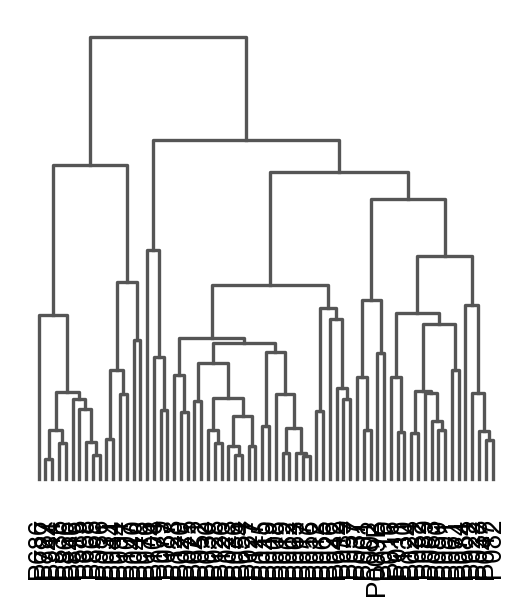

<Axes: >

In [20]:
# dendrogram after converting mouse gene to human gene
sc.tl.dendrogram(adata_F, 'patient')
sc.pl.dendrogram(adata_F, 'patient')

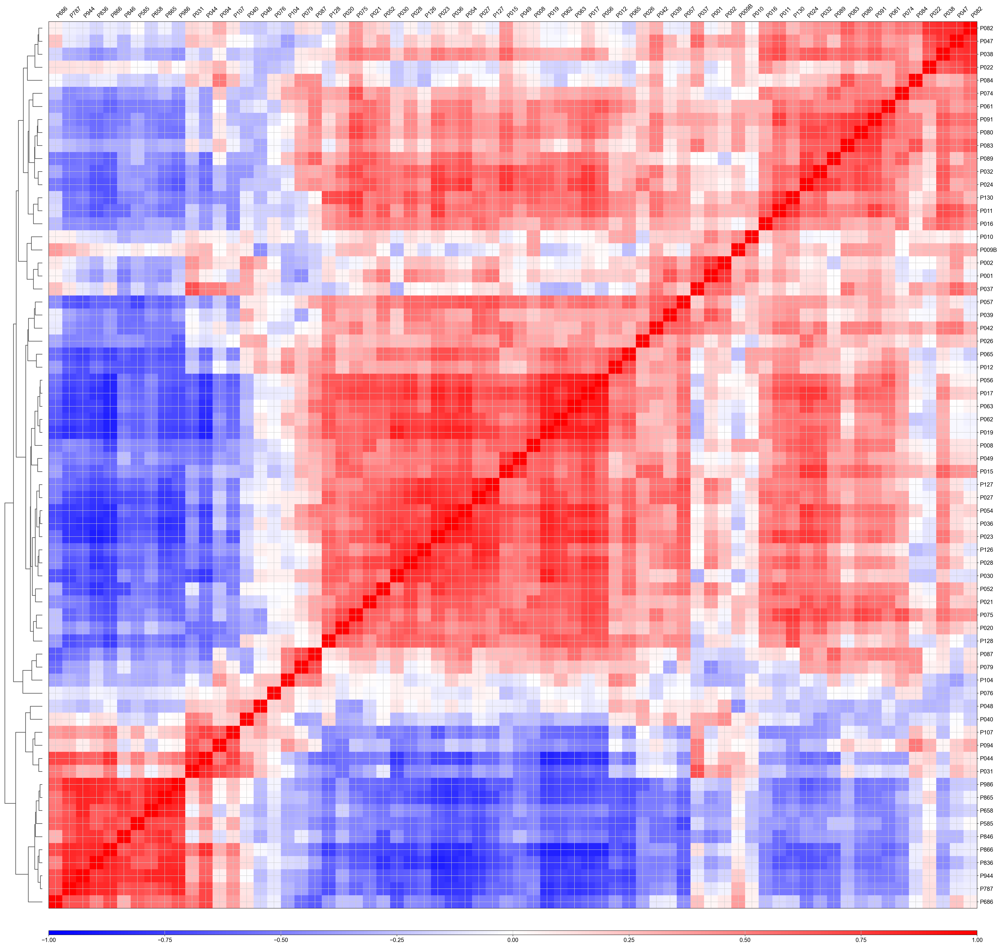

In [21]:
sc.pl.correlation_matrix(adata_F, groupby='patient')

In [22]:
adata_F

AnnData object with n_obs × n_vars = 18437 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_ce

In [23]:
#previous data (not sorted 1~11)
#sc.pl.dotplot(adata, ['CCR2'], groupby='patient', use_raw=False)

In [24]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata_F, 'batch')
'X_pca_harmony' in adata_F.obsm
True

2023-04-24 23:28:20,752 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-04-24 23:28:35,765 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-04-24 23:28:35,957 - harmonypy - INFO - Iteration 1 of 10
2023-04-24 23:28:46,605 - harmonypy - INFO - Iteration 2 of 10
2023-04-24 23:28:56,851 - harmonypy - INFO - Iteration 3 of 10
2023-04-24 23:29:07,390 - harmonypy - INFO - Iteration 4 of 10
2023-04-24 23:29:17,582 - harmonypy - INFO - Iteration 5 of 10
2023-04-24 23:29:25,355 - harmonypy - INFO - Iteration 6 of 10
2023-04-24 23:29:32,069 - harmonypy - INFO - Iteration 7 of 10
2023-04-24 23:29:39,637 - harmonypy - INFO - Converged after 7 iterations


True

In [25]:
adata_F.obsm['X_pca'] = adata_F.obsm['X_pca_harmony']
sc.pp.neighbors(adata_F)
sc.tl.pca(adata_F)
sc.tl.umap(adata_F)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing PCA
    with n_comps=50
    finished (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_patient']`


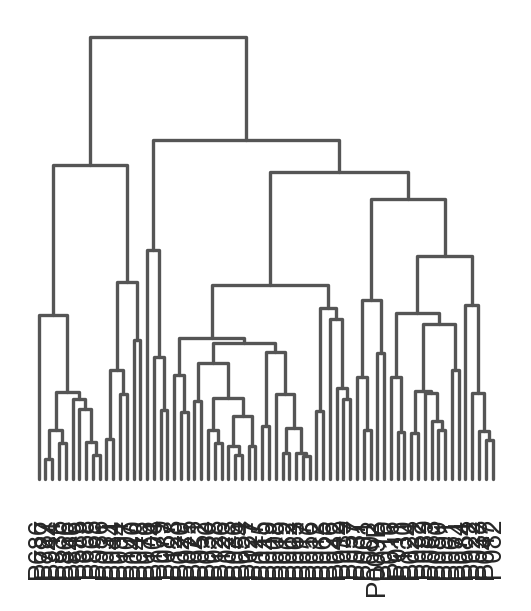

<Axes: >

In [36]:
sc.tl.dendrogram(adata_F, 'patient', n_pcs=50)
sc.pl.dendrogram(adata_F, 'patient')

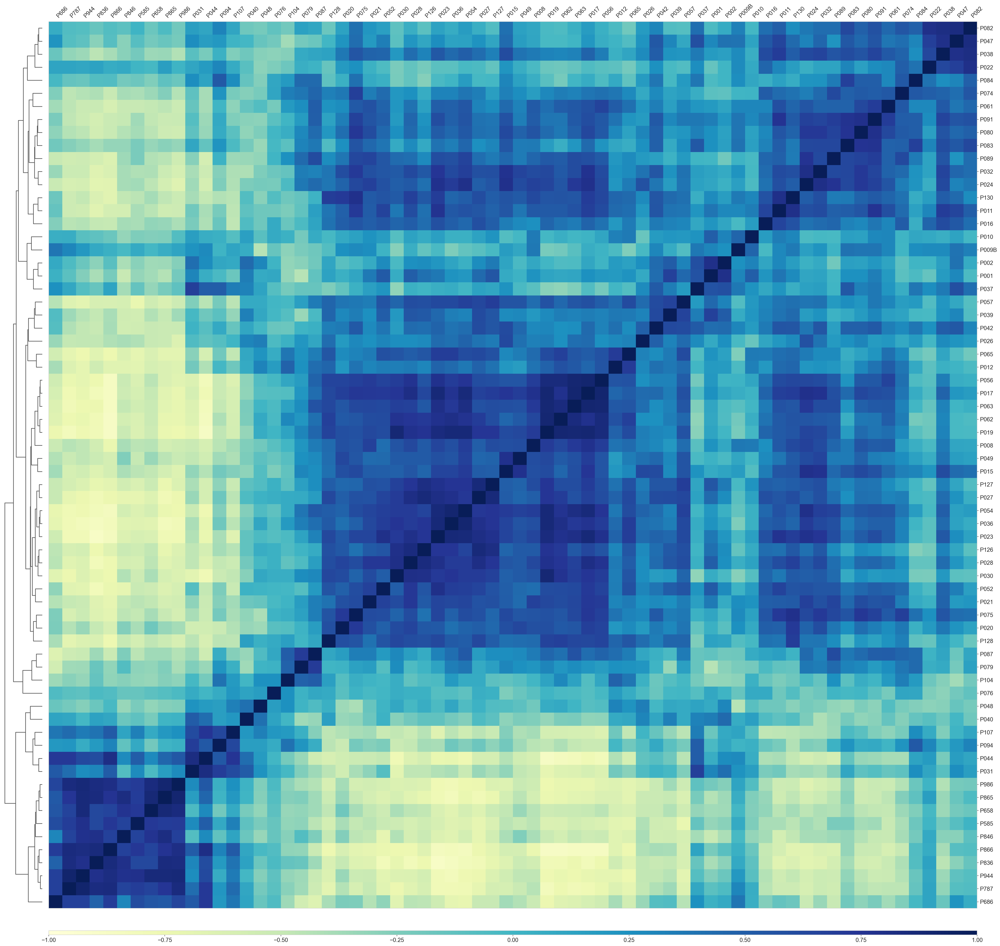

In [37]:
sc.pl.correlation_matrix(adata_F, groupby='patient',cmap='YlGnBu', save='_B_cell_GroupABC_correlation_matrix_modified.pdf')

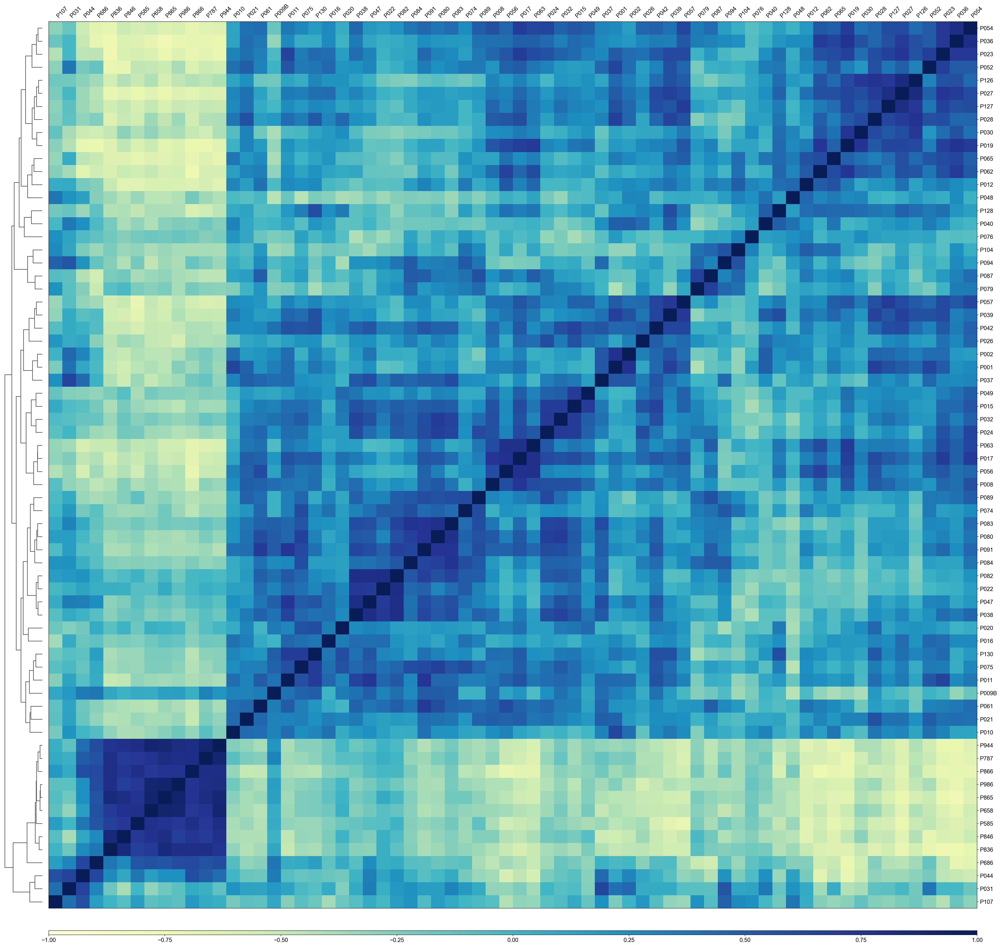

In [16]:
# previous result
#sc.pl.correlation_matrix(adata_F, groupby='patient',cmap='YlGnBu', save='_B_cell_GroupABC_correlation_matrix.pdf')

# check

In [42]:
#sc.pl.umap(adata, color=['patient'], save='umap_Group_A_patient_immune.pdf')

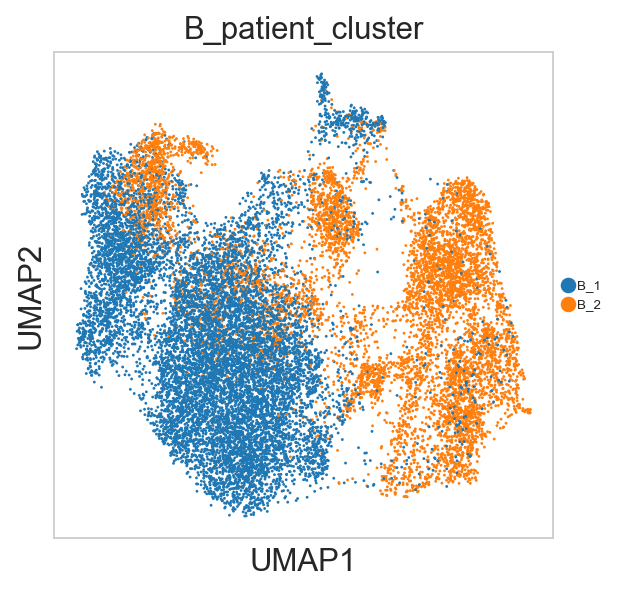

In [38]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'B_1': ["P082",	"P047",	"P038",	"P022",	"P084",	"P074",	"P061",	"P091",	"P080",	"P083",	"P089",	"P032",	"P024",	"P130",	"P011",	"P016",	"P010",	"P009B",	"P002",	"P001",	"P037",	"P057",	"P039",	"P042",	"P026",	"P065",	"P012",	"P056",	"P017",	"P063",	"P062",	"P019",	"P008",	"P049",	"P015",	"P127",	"P027",	"P054",	"P036",	"P023",	"P126",	"P028",	"P030",	"P052",	"P021",	"P075",	"P020",	"P128",	"P087",	"P079",	"P104",	"P076",
],
             'B_2': ["P048",	"P040",	"P107",	"P094",	"P044",	"P031",	"P986",	"P865",	"P658",	"P585",	"P846",	"P866",	"P836",	"P944",	"P787",	"P686",
],
             }

# Initialize empty column in cell metadata
adata_F.obs['B_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_F.obs.patient).isin(cell_dict[i])
    adata_F.obs.loc[ind,'B_patient_cluster'] = i

sc.pl.umap(adata_F, color=['B_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_B_patient_cluster_in_Bcell_modified.pdf')


In [39]:
pd.crosstab(adata_F.obs['B_patient_cluster'], adata_F.obs['B_patient_cluster'])

B_patient_cluster,B_1,B_2
B_patient_cluster,,
B_1,11090,0
B_2,0,7347


In [40]:
adata_F.obs['patient'].cat.reorder_categories(['P001','P002','P008','P009B','P010','P011','P012','P015','P016','P017',
                                             'P019','P020','P021','P022','P023','P024','P026','P027','P028','P030','P031','P032',
                                             'P036','P037','P038','P039','P040','P042','P044','P047','P048','P049',
                                            'P052','P054','P056','P057','P061','P062','P063','P065','P074','P075','P076',
                                             'P079','P080','P082','P083','P084','P087','P089','P091','P094','P104','P107','P126',
                                             'P127','P128','P130','P585','P658','P686','P787','P836','P846','P865','P866','P944','P986'
                                             ],inplace=True)
adata_F.obs['patient']

ACTGTCCTCCTTGACC-1-0-0     P686
CCTTCCCTCAGCACAT-1-0-0     P686
CGACTTCTCCTCGCAT-1-0-0     P686
GGTGCGTTCTGAGTGT-1-0-0     P686
CGCTATCCACCGATAT-1-1-0     P658
                           ... 
TTCTTAGTCTTGTCAT-1-24-2    P001
TTGAACGGTACAGTTC-1-24-2    P001
TTGACTTAGCAGACTG-1-24-2    P001
TTTACTGCAGGTGGAT-1-24-2    P001
TTTGCGCGTGTTGGGA-1-24-2    P001
Name: patient, Length: 18437, dtype: category
Categories (68, object): ['P001', 'P002', 'P008', 'P009B', ..., 'P865', 'P866', 'P944', 'P986']

In [23]:
adata_F.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,celltype,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,B_patient_cluster
ACTGTCCTCCTTGACC-1-0-0,736.0,723,989.930542,28.089190,2.837491,tumor,P686,15,0,111.967453,...,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3
CCTTCCCTCAGCACAT-1-0-0,387.0,383,760.317261,7.139949,0.939075,tumor,P686,15,0,203.326874,...,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3
CGACTTCTCCTCGCAT-1-0-0,617.0,611,948.084106,26.889112,2.836153,tumor,P686,15,0,92.150139,...,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3
GGTGCGTTCTGAGTGT-1-0-0,801.0,790,1068.575562,16.854071,1.577247,tumor,P686,15,0,127.007507,...,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3
CGCTATCCACCGATAT-1-1-0,511.0,499,784.279907,27.919434,3.559881,tumor,P658,15,0,145.817093,...,15,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTGTCAT-1-24-2,2287.0,2228,1625.009888,20.684313,1.272873,tumor,P001,3,2,189.416702,...,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2
TTGAACGGTACAGTTC-1-24-2,961.0,930,1258.517090,23.169865,1.841045,tumor,P001,3,2,184.791702,...,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2
TTGACTTAGCAGACTG-1-24-2,2042.0,1985,1498.537842,30.164787,2.012948,tumor,P001,3,2,207.026703,...,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2
TTTACTGCAGGTGGAT-1-24-2,1790.0,1748,1410.335449,19.716057,1.397969,tumor,P001,3,2,202.613861,...,3,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2


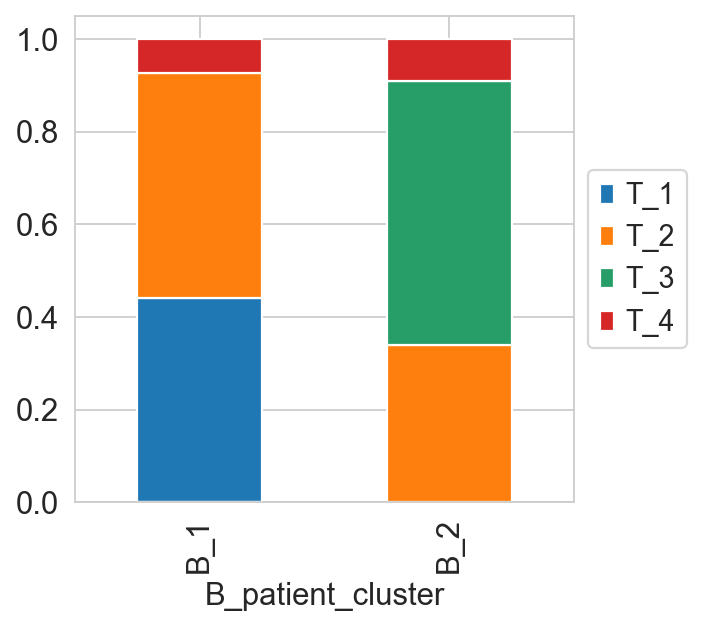

In [41]:
tmp = pd.crosstab(adata_F.obs['B_patient_cluster'],adata_F.obs['T_patient_cluster4'], normalize='index')
ax = tmp.plot.bar(stacked=True).legend(loc='center left', bbox_to_anchor=(1.0, 0.5)).get_figure()

ax.savefig('Bcell_stacked_bar.pdf')

In [25]:
pd.crosstab(adata_F.obs['B_patient_cluster'],adata_F.obs['T_patient_cluster4'])

T_patient_cluster4,T_1,T_2,T_3,T_4
B_patient_cluster,,,,
B_1,2707,5712,0,521
B_2,2180,1371,0,687
B_3,0,796,4196,267


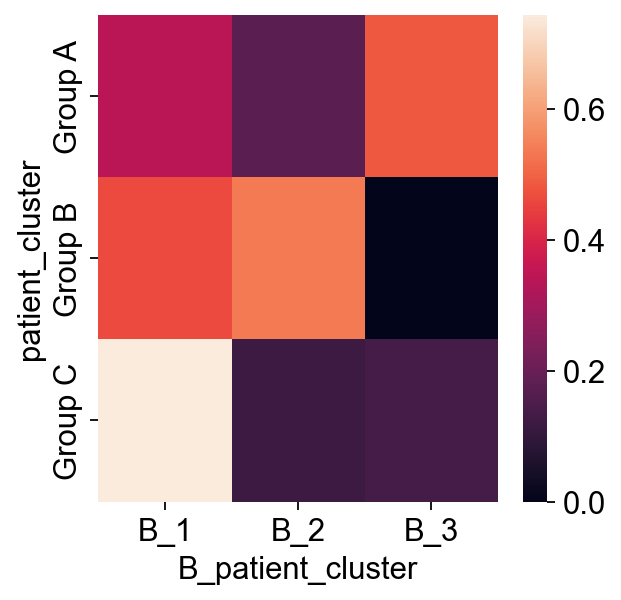

In [26]:
svm = sns.heatmap(pd.crosstab(adata_F.obs["patient_cluster"], adata_F.obs["B_patient_cluster"], normalize="index"))
svm.figure.savefig('heatmap_tumor_group_to_T_cell.pdf', dpi=400)

In [42]:
sc.pp.neighbors(adata_F)
sc.tl.umap(adata_F)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


In [43]:
df1 = pd.crosstab(adata_F.obs['patient'], adata_F.obs['B_patient_cluster'])
df1

B_patient_cluster,B_1,B_2
patient,,
P001,207,0
P002,457,0
P008,220,0
P009B,70,0
P010,106,0
...,...,...
P846,0,713
P865,0,115
P866,0,1178


In [44]:
df2 = pd.crosstab(adata_F.obs['patient'], adata_F.obs['T_patient_cluster4'])
df2

T_patient_cluster4,T_1,T_2,T_3,T_4
patient,,,,
P001,207,0,0,0
P002,0,457,0,0
P008,220,0,0,0
P009B,0,0,0,70
P010,106,0,0,0
...,...,...,...,...
P846,0,0,713,0
P865,0,0,115,0
P866,0,0,1178,0


In [45]:
df3 = pd.concat([df1, df2], axis=1, ignore_index=False)
df3

,B_1,B_2,T_1,T_2,T_3,T_4
patient,,,,,,
P001,207,0,207,0,0,0
P002,457,0,0,457,0,0
P008,220,0,220,0,0,0
P009B,70,0,0,0,0,70
P010,106,0,106,0,0,0
...,...,...,...,...,...,...
P846,0,713,0,0,713,0
P865,0,115,0,0,115,0
P866,0,1178,0,0,1178,0


In [46]:
df3.to_csv('Bcell_class_by_B_and_T_clusters_modified.csv')

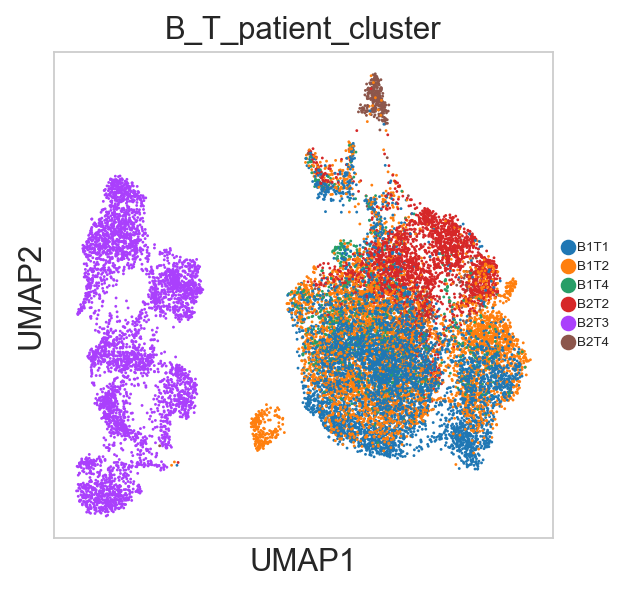

In [47]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'B1T1': ["P065",	"P062",	"P030",	"P057",	"P063",	"P012",	"P056",	"P027",	"P008",	"P001",	"P130",	"P028",	"P011",	"P126",	"P061",	"P010",	"P021",	"P015",	"P020",	"P032",	"P127",	"P049",	"P016",
],
             'B1T2':["P104",	"P128",	"P054",	"P002",	"P079",	"P076",	"P023",	"P084",	"P087",	"P017",	"P026",	"P042",	"P083",	"P019",	"P036",	"P037",	"P089",
],
             'B1T3':[],
             'B1T4':["P074",	"P052",	"P039",	"P075",	"P091",	"P009B",	"P024",	"P022",	"P080",	"P082",	"P047",	"P038",
],
            
             'B2T1': [],
            'B2T2': ["P048",	"P094",	"P031",	"P107",
],
             'B2T3':["P866",	"P836",	"P846",	"P986",	"P585",	"P658",	"P865",	"P944",	"P787",	"P686",
],
             'B2T4':["P040",	"P044",
]
 
             }

# Initialize empty column in cell metadata
adata_F.obs['B_T_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_F.obs.patient).isin(cell_dict[i])
    adata_F.obs.loc[ind,'B_T_patient_cluster'] = i

sc.pl.umap(adata_F, color=['B_T_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_B_T_patient_cluster_in_Bcell_modified.pdf')


In [36]:
adata_F.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,B_patient_cluster,B_T_patient_cluster
ACTGTCCTCCTTGACC-1-0-0,736.0,723,989.930542,28.089190,2.837491,tumor,P686,15,0,111.967453,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3,B3T3
CCTTCCCTCAGCACAT-1-0-0,387.0,383,760.317261,7.139949,0.939075,tumor,P686,15,0,203.326874,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3,B3T3
CGACTTCTCCTCGCAT-1-0-0,617.0,611,948.084106,26.889112,2.836153,tumor,P686,15,0,92.150139,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3,B3T3
GGTGCGTTCTGAGTGT-1-0-0,801.0,790,1068.575562,16.854071,1.577247,tumor,P686,15,0,127.007507,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3,B3T3
CGCTATCCACCGATAT-1-1-0,511.0,499,784.279907,27.919434,3.559881,tumor,P658,15,0,145.817093,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_3,B3T3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTGTCAT-1-24-2,2287.0,2228,1625.009888,20.684313,1.272873,tumor,P001,3,2,189.416702,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2,B2T1
TTGAACGGTACAGTTC-1-24-2,961.0,930,1258.517090,23.169865,1.841045,tumor,P001,3,2,184.791702,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2,B2T1
TTGACTTAGCAGACTG-1-24-2,2042.0,1985,1498.537842,30.164787,2.012948,tumor,P001,3,2,207.026703,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2,B2T1
TTTACTGCAGGTGGAT-1-24-2,1790.0,1748,1410.335449,19.716057,1.397969,tumor,P001,3,2,202.613861,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_2,B2T1


In [48]:
adata_F

AnnData object with n_obs × n_vars = 18437 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44', 'B_patient_cluster', 'B_T_patient_cluster'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-

In [49]:
adata_F.write('Bcell_from_Group_ABC_patients_immune_after_harmony.h5ad', compression='gzip')

In [9]:
adata_F = sc.read('Bcell_from_Group_ABC_patients_immune_after_harmony.h5ad')

saving figure to file ./figures/scvelo__scatterplot_Bcell_BtoT_cluster.pdf


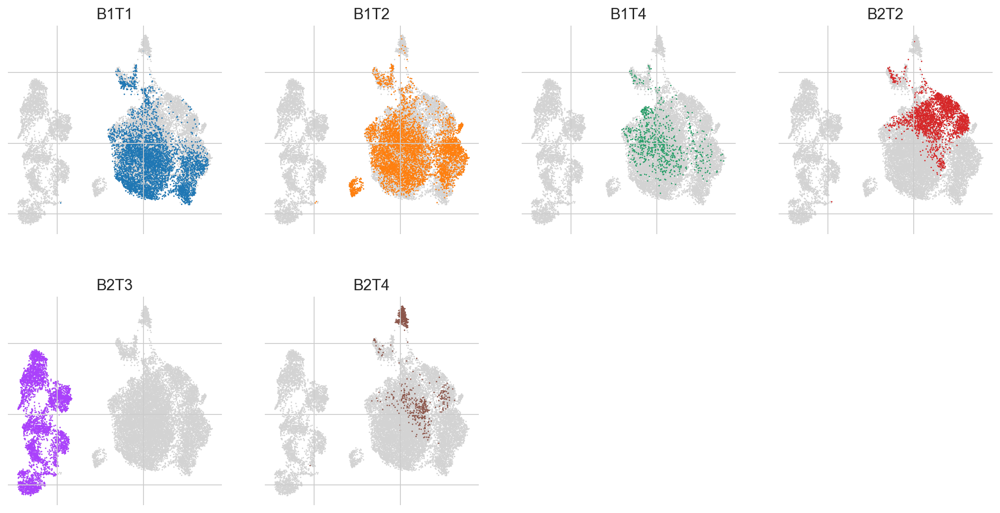

In [51]:
scv.pl.scatter(adata_F, groups=[[c] for c in adata_F.obs['B_T_patient_cluster'].cat.categories], color='B_T_patient_cluster', ncols=4, save="_scatterplot_Bcell_BtoT_cluster.pdf")

In [52]:
scv.set_figure_params(style='scvelo', dpi=100, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__scatterplot_Bcell_BtoT_cluster_downsize.pdf


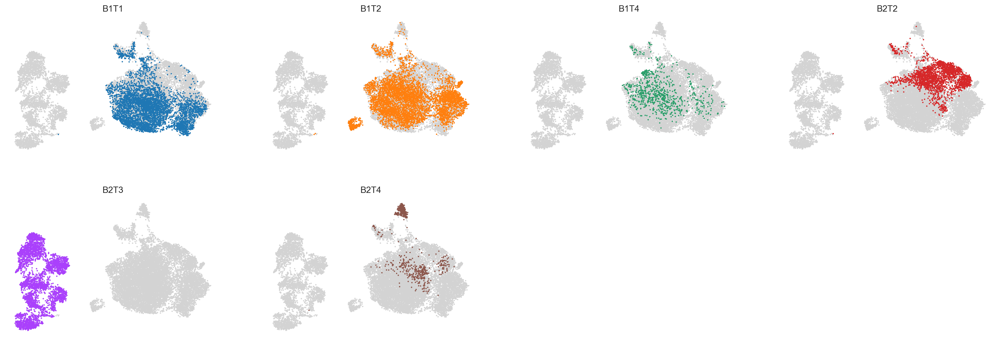

In [53]:
scv.pl.scatter(adata_F, groups=[[c] for c in adata_F.obs['B_T_patient_cluster'].cat.categories], color='B_T_patient_cluster', ncols=4, save="_scatterplot_Bcell_BtoT_cluster_downsize.pdf")

In [30]:
adata_F.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,B_patient_cluster,B_T_patient_cluster
ACTGTCCTCCTTGACC-1-0-0,736.0,723,989.930542,28.089190,2.837491,tumor,P686,15,0,111.967453,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
CCTTCCCTCAGCACAT-1-0-0,387.0,383,760.317261,7.139949,0.939075,tumor,P686,15,0,203.326874,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
CGACTTCTCCTCGCAT-1-0-0,617.0,611,948.084106,26.889112,2.836153,tumor,P686,15,0,92.150139,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
GGTGCGTTCTGAGTGT-1-0-0,801.0,790,1068.575562,16.854071,1.577247,tumor,P686,15,0,127.007507,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
CGCTATCCACCGATAT-1-1-0,511.0,499,784.279907,27.919434,3.559881,tumor,P658,15,0,145.817093,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTGTCAT-1-24-2,2287.0,2228,1625.009888,20.684313,1.272873,tumor,P001,3,2,189.416702,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1
TTGAACGGTACAGTTC-1-24-2,961.0,930,1258.517090,23.169865,1.841045,tumor,P001,3,2,184.791702,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1
TTGACTTAGCAGACTG-1-24-2,2042.0,1985,1498.537842,30.164787,2.012948,tumor,P001,3,2,207.026703,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1
TTTACTGCAGGTGGAT-1-24-2,1790.0,1748,1410.335449,19.716057,1.397969,tumor,P001,3,2,202.613861,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1


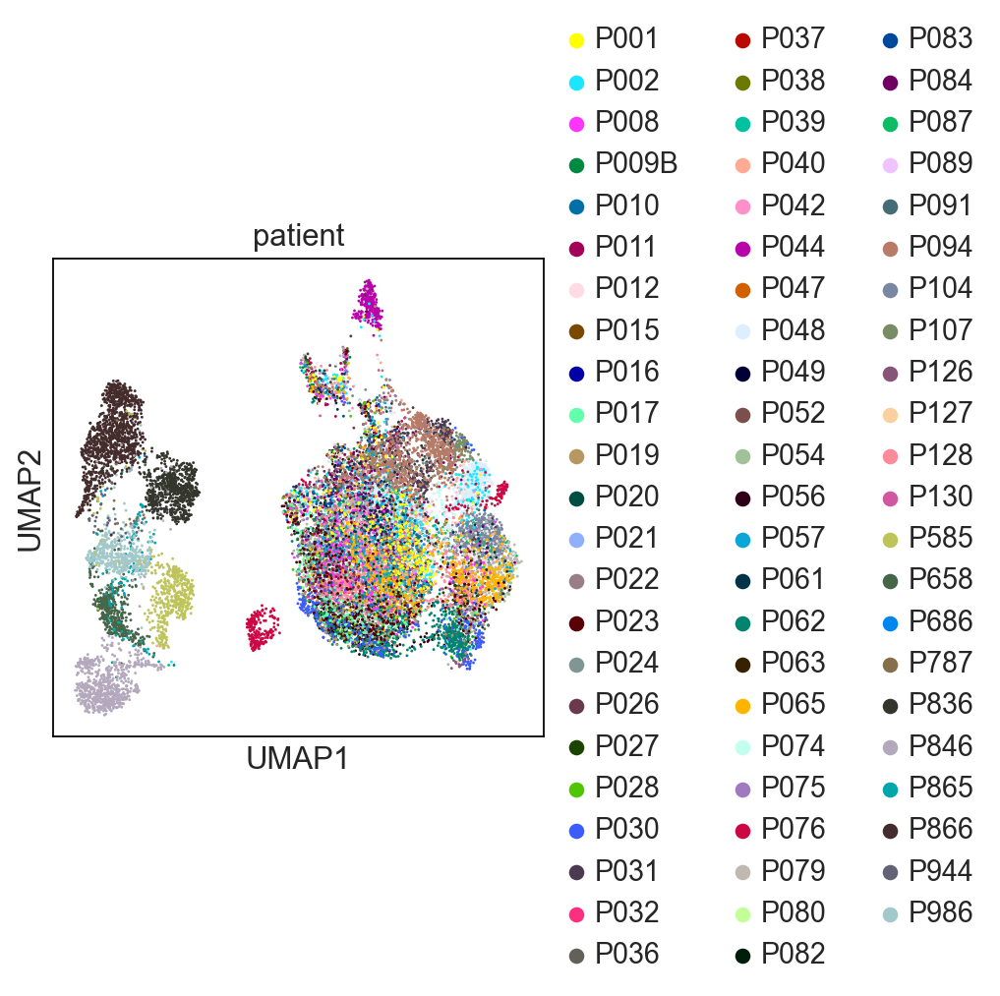

In [41]:
sc.pl.umap(adata_F, color=['patient'], save='Bcell_Group_ABC_patient_immune-modified.pdf')

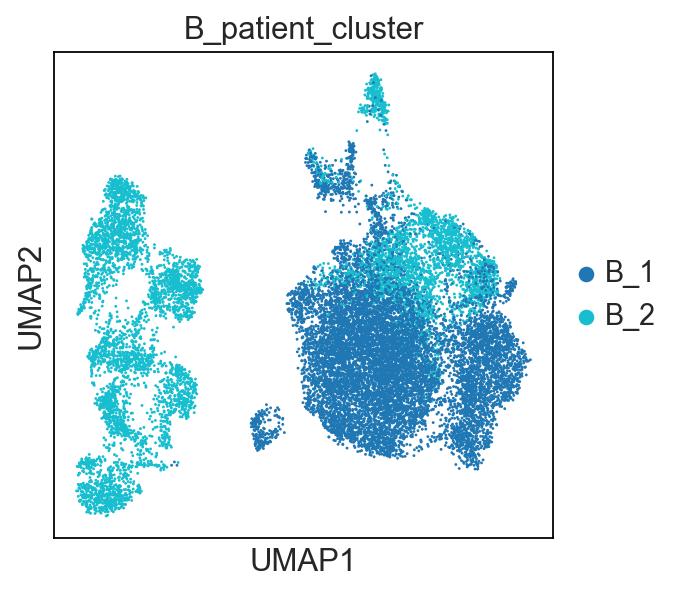

In [42]:
sc.pl.umap(adata_F, color=['B_patient_cluster'], palette='tab10', save='B_cluster_in_B_cell.pdf')

In [65]:
df_7 = pd.crosstab(adata_F.obs['patient'],adata_F.obs['patient_cluster'], normalize='index')
df_7

patient_cluster,Group A,Group B,Group C
patient,,,
P001,1.0,0.0,0.0
P002,0.0,0.0,1.0
P008,0.0,1.0,0.0
P009B,0.0,1.0,0.0
P010,0.0,1.0,0.0
...,...,...,...
P846,1.0,0.0,0.0
P865,1.0,0.0,0.0
P866,1.0,0.0,0.0


In [66]:
df_8 = pd.crosstab(adata_F.obs['patient'],adata_F.obs['T_patient_cluster4'], normalize='index')
df_8

T_patient_cluster4,T_1,T_2,T_3,T_4
patient,,,,
P001,1.0,0.0,0.0,0.0
P002,0.0,1.0,0.0,0.0
P008,1.0,0.0,0.0,0.0
P009B,0.0,0.0,0.0,1.0
P010,1.0,0.0,0.0,0.0
...,...,...,...,...
P846,0.0,0.0,1.0,0.0
P865,0.0,0.0,1.0,0.0
P866,0.0,0.0,1.0,0.0


In [67]:
df_9 = pd.crosstab(adata_F.obs['patient'],adata_F.obs['Myeloid_patient_cluster4'], normalize='index')
df_9

Myeloid_patient_cluster4,Myeloid_1,Myeloid_2,Myeloid_3,Myeloid_4
patient,,,,
P001,0.0,0.0,1.0,0.0
P002,0.0,0.0,1.0,0.0
P008,0.0,0.0,1.0,0.0
P009B,1.0,0.0,0.0,0.0
P010,0.0,1.0,0.0,0.0
...,...,...,...,...
P846,0.0,1.0,0.0,0.0
P865,0.0,1.0,0.0,0.0
P866,0.0,1.0,0.0,0.0


In [68]:
df_10 = pd.crosstab(adata_F.obs['patient'],adata_F.obs['B_patient_cluster'], normalize='index')
df_10

B_patient_cluster,B_1,B_2
patient,,
P001,1.0,0.0
P002,1.0,0.0
P008,1.0,0.0
P009B,1.0,0.0
P010,1.0,0.0
...,...,...
P846,0.0,1.0
P865,0.0,1.0
P866,0.0,1.0


In [69]:
df_11 = pd.concat([df_7,df_8, df_9, df_10], axis=1)
df_11

,Group A,Group B,Group C,T_1,T_2,T_3,T_4,Myeloid_1,Myeloid_2,Myeloid_3,Myeloid_4,B_1,B_2
patient,,,,,,,,,,,,,
P001,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
P002,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
P008,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
P009B,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
P010,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
P846,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
P865,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
P866,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [70]:
df_11.to_csv('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/patient_T_Myeloid_B_groups.csv')

In [71]:
# loading data made from 3 T cell classes and 3 Myeloid cell classes
#adata = sc.read('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell/GroupABC_integrated/T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

# Sankey plot with B cells only

In [10]:
df = pd.DataFrame(adata_F.obs)
df

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,B_patient_cluster,B_T_patient_cluster
ACTGTCCTCCTTGACC-1-0-0,736.0,723,989.930542,28.089190,2.837491,tumor,P686,15,0,111.967453,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
CCTTCCCTCAGCACAT-1-0-0,387.0,383,760.317261,7.139949,0.939075,tumor,P686,15,0,203.326874,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
CGACTTCTCCTCGCAT-1-0-0,617.0,611,948.084106,26.889112,2.836153,tumor,P686,15,0,92.150139,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
GGTGCGTTCTGAGTGT-1-0-0,801.0,790,1068.575562,16.854071,1.577247,tumor,P686,15,0,127.007507,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
CGCTATCCACCGATAT-1-1-0,511.0,499,784.279907,27.919434,3.559881,tumor,P658,15,0,145.817093,...,B cell,B cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3,B_2,B2T3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTAGTCTTGTCAT-1-24-2,2287.0,2228,1625.009888,20.684313,1.272873,tumor,P001,3,2,189.416702,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1
TTGAACGGTACAGTTC-1-24-2,961.0,930,1258.517090,23.169865,1.841045,tumor,P001,3,2,184.791702,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1
TTGACTTAGCAGACTG-1-24-2,2042.0,1985,1498.537842,30.164787,2.012948,tumor,P001,3,2,207.026703,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1
TTTACTGCAGGTGGAT-1-24-2,1790.0,1748,1410.335449,19.716057,1.397969,tumor,P001,3,2,202.613861,...,B cell,B cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1,B_1,B1T1


In [11]:
print (df.dtypes)

n_genes                      float64
n_genes_by_counts              int32
total_counts                 float32
total_counts_mt              float32
pct_counts_mt                float32
tissue                      category
patient                     category
leiden                      category
batch                       category
total_counts_ribo            float32
pct_counts_ribo              float32
total_counts_hb              float32
pct_counts_hb                float32
percent_mt2                  float32
n_counts                     float32
celltype                    category
crude                       category
celltype_detail             category
patient_cluster             category
dataset                     category
T_patient_cluster            float64
T_patient_cluster4          category
Myeloid_patient_cluster4    category
Myeloid_to_T_cluster44      category
B_patient_cluster           category
B_T_patient_cluster         category
dtype: object


In [12]:
df['patient'] = df['patient'].astype(object)
df['crude'] = df['crude'].astype(object)
df['leiden'] = df['leiden'].astype(object)
df['patient_cluster'] = df['patient_cluster'].astype(object)
df['T_patient_cluster'] = df['T_patient_cluster'].astype(object)
df['T_patient_cluster4'] = df['T_patient_cluster4'].astype(object)
df['B_patient_cluster'] = df['B_patient_cluster'].astype(object)
df['celltype'] = df['celltype'].astype(object)
df['batch'] = df['batch'].astype(object)


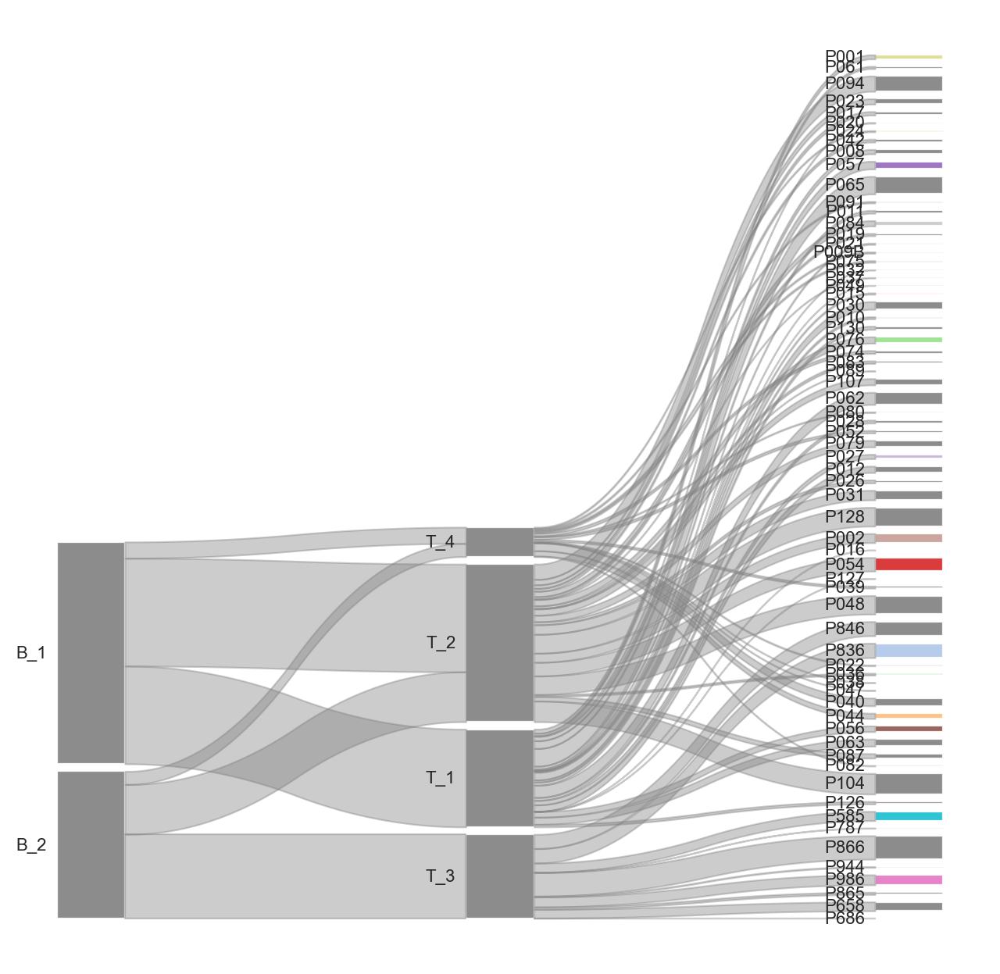

In [13]:
#pySnakey2 package
# for multilayer dataframe
import matplotlib.pyplot as plt
import pandas as pd
from pysankey2 import Sankey
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf


df_1 = df[['B_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("B_group_tumor_group_comparison.pdf", bbox_inches="tight", dpi=300)

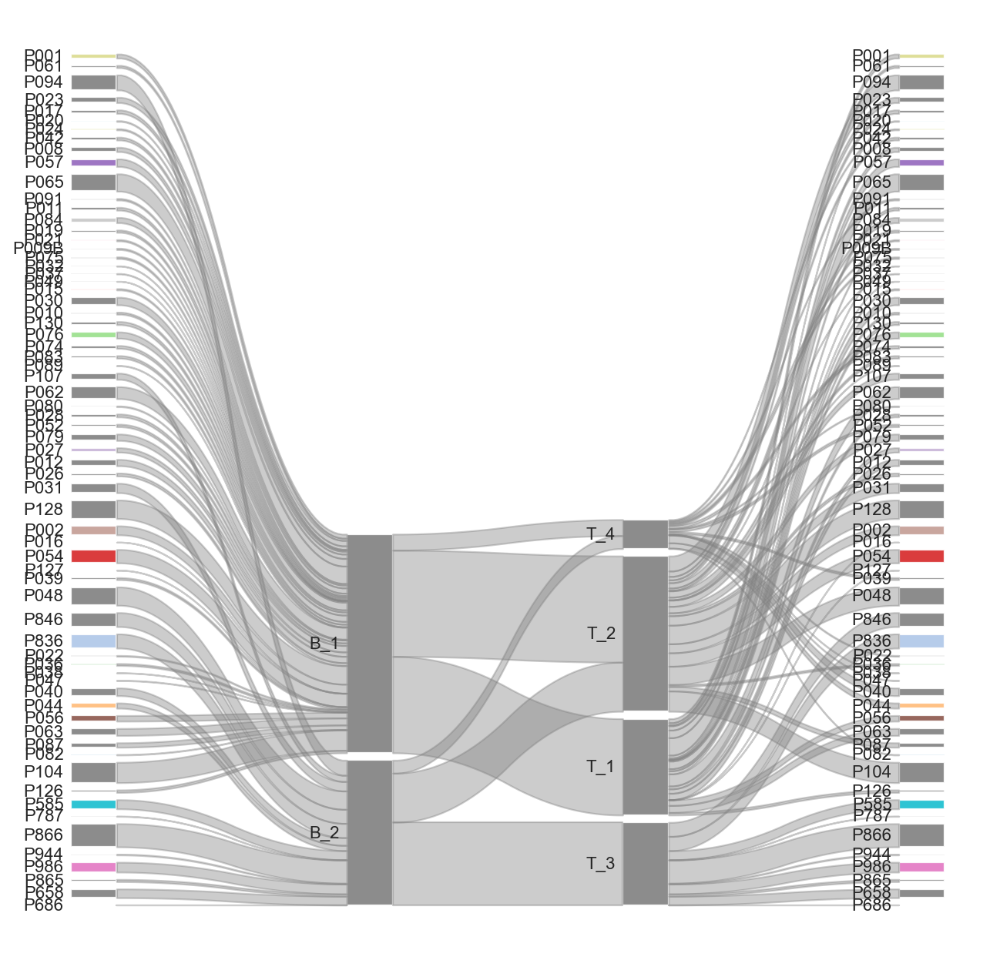

In [14]:
df_1 = df[['patient','B_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("B_group_tumor_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

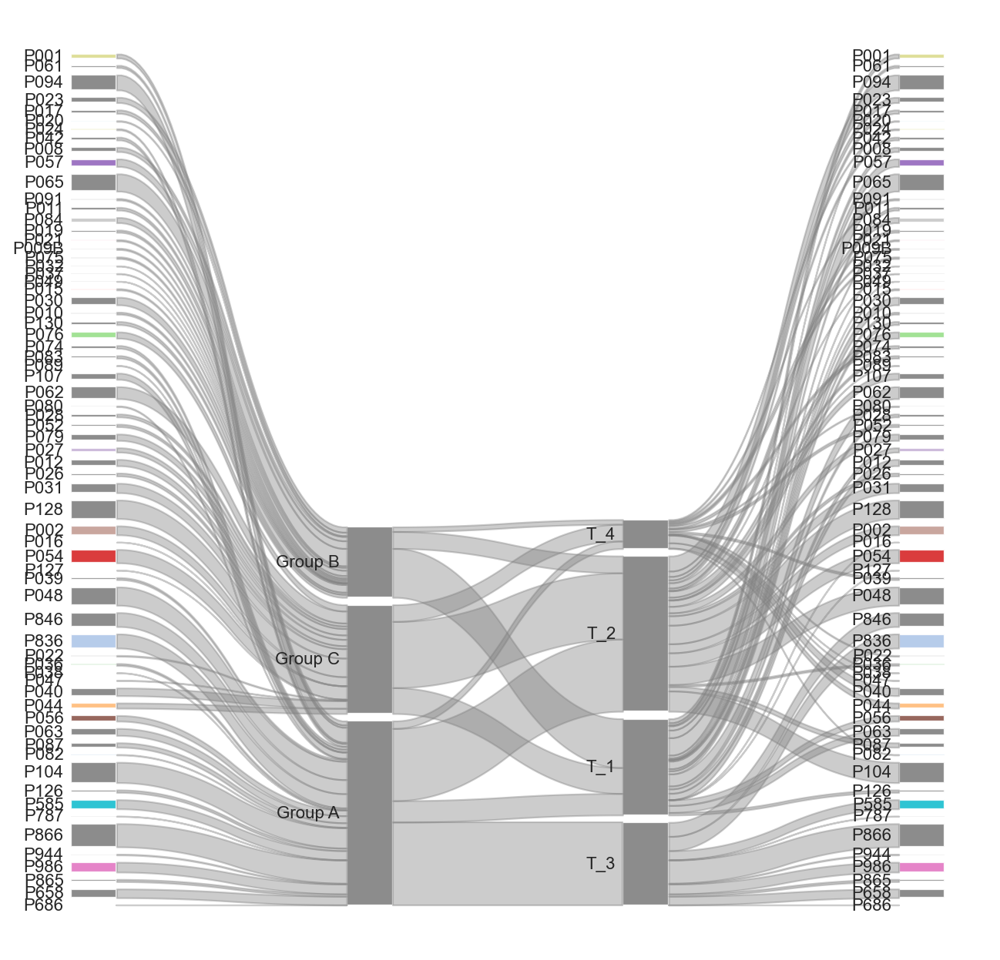

In [15]:
df_1 = df[['patient','patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_group_tumor_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

# Sankey plot with T cells (with Fibroblast classification)

In [16]:
adata_T = sc.read('T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [17]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P049','P020','P062','P032','P016','P061','P012',
                     'P057','P015','P065','P063','P130','P056', 'P011','P127','P126','P001',
                     'P028','P027','P030'],
             'T_2': ['P037','P031','P026','P042','P019','P017','P036','P054','P023','P128',
                     'P048','P002','P104','P087','P094','P084','P079','P107','P076','P089',
                     'P083'],
                     
                   
             'T_3': [ 'P986','P658','P836','P866','P846','P686','P865','P585','P944','P787'],
             'T_4': ['P052','P024','P040','P039','P080','P075','P091','P009B','P082','P022',
                     'P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'T_patient_cluster4'] = i


In [18]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P130','P010','P986','P865','P585','P866','P846','P686','P658','P944','P836','P787'],
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P062',
                          'P027','P065','P057','P008','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012'],
             'No_M': ['P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [19]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


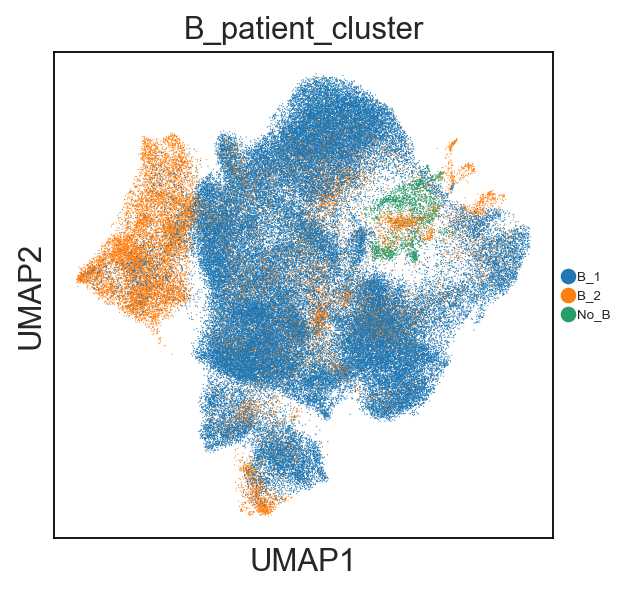

In [20]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'B_1': ["P082",	"P047",	"P038",	"P022",	"P084",	"P074",	"P061",	"P091",	"P080",	"P083",	"P089",	"P032",	"P024",	"P130",	"P011",	"P016",	"P010",	"P009B",	"P002",	"P001",	"P037",	"P057",	"P039",	"P042",	"P026",	"P065",	"P012",	"P056",	"P017",	"P063",	"P062",	"P019",	"P008",	"P049",	"P015",	"P127",	"P027",	"P054",	"P036",	"P023",	"P126",	"P028",	"P030",	"P052",	"P021",	"P075",	"P020",	"P128",	"P087",	"P079",	"P104",	"P076",
],
             'B_2': ["P048",	"P040",	"P107",	"P094",	"P044",	"P031",	"P986",	"P865",	"P658",	"P585",	"P846",	"P866",	"P836",	"P944",	"P787",	"P686",
],  
             'No_B': ["P009A"]}

# Initialize empty column in cell metadata
adata_T.obs['B_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'B_patient_cluster'] = i

sc.pl.umap(adata_T, color=['B_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_B_patient_cluster_in_T_cell.pdf')


# Check

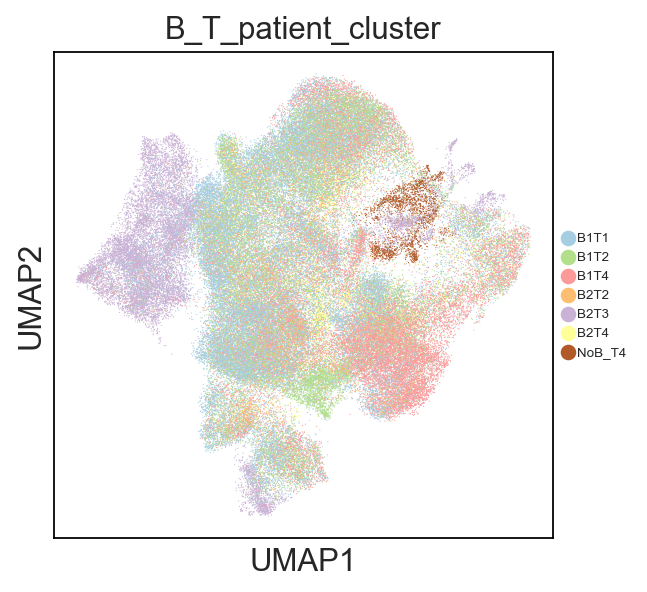

In [21]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'B1T1': ["P065",	"P062",	"P030",	"P057",	"P063",	"P012",	"P056",	"P027",	"P008",	"P001",	"P130",	"P028",	"P011",	"P126",	"P061",	"P010",	"P021",	"P015",	"P020",	"P032",	"P127",	"P049",	"P016",
],
             'B1T2':["P104",	"P128",	"P054",	"P002",	"P079",	"P076",	"P023",	"P084",	"P087",	"P017",	"P026",	"P042",	"P083",	"P019",	"P036",	"P037",	"P089",
],
             'B1T3':[],
             'B1T4':["P074",	"P052",	"P039",	"P075",	"P091",	"P009B",	"P024",	"P022",	"P080",	"P082",	"P047",	"P038",
],
            
             'B2T1': [],
            'B2T2': ["P048",	"P094",	"P031",	"P107",
],
             'B2T3':["P866",	"P836",	"P846",	"P986",	"P585",	"P658",	"P865",	"P944",	"P787",	"P686",
],
             'B2T4':["P040",	"P044",
],
             'NoB_T4':['P009A']}

# Initialize empty column in cell metadata
adata_T.obs['B_T_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'B_T_patient_cluster'] = i

sc.pl.umap(adata_T, color=['B_T_patient_cluster'], legend_loc='right margin',palette ='Paired', legend_fontsize=6, save='umap_B_T_patient_cluster_in_T_cell.pdf')


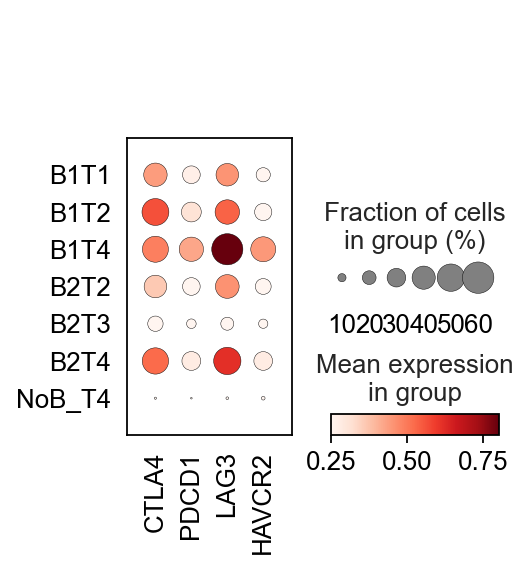

In [15]:
sc.pl.dotplot(adata_T, ['CTLA4','PDCD1','LAG3','HAVCR2'],vmin=0.25, groupby=['B_T_patient_cluster'],save='exhausted_T_markers_in_T_cell_B_T_group.pdf')

In [45]:
scv.set_figure_params(style='scvelo', dpi=100, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__scatter_BT_Groups_in_Tcells.pdf


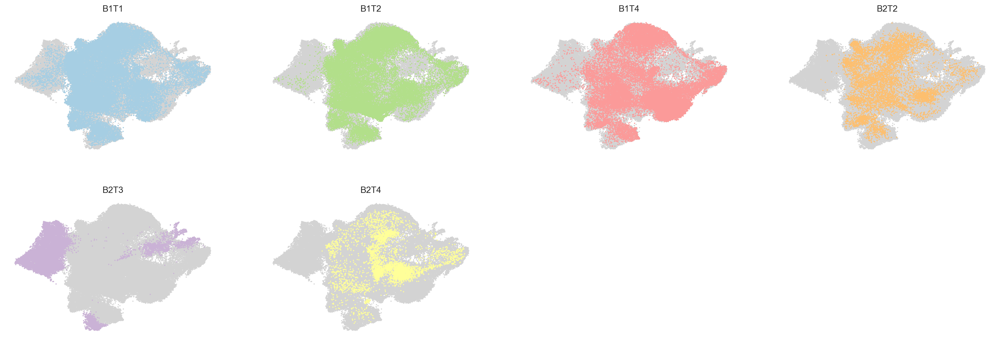

In [46]:
scv.pl.scatter(adata_T, groups=[[c] for c in adata_F.obs['B_T_patient_cluster'].cat.categories], color='B_T_patient_cluster', ncols=4, save="_scatter_BT_Groups_in_Tcells.pdf")

In [22]:
df = pd.DataFrame(adata_T.obs)
df

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_to_T_cluster44,Myeloid_patient_cluster4,B_patient_cluster,B_T_patient_cluster
AAACCTGAGTAGCCGA-1-0-0,3934.0,3879,1452.073242,18.802568,1.294877,tumor,P686,6,0,198.197769,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B_2,B2T3
AAACCTGCAAGAGGCT-1-0-0,674.0,669,882.995728,11.229170,1.271713,tumor,P686,6,0,213.666718,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B_2,B2T3
AAACCTGCAGTATCTG-1-0-0,1014.0,1003,956.411804,18.788149,1.964441,tumor,P686,6,0,221.148575,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B_2,B2T3
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,6,0,176.360626,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B_2,B2T3
AAACCTGGTGCGCTTG-1-0-0,786.0,772,876.556519,18.123993,2.067635,tumor,P686,6,0,217.813019,...,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B_2,B2T3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCAAATCA-1-24-2,1375.0,1351,1476.700806,22.369625,1.514838,tumor,P001,1,2,184.743835,...,T cell,effector T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B_1,B1T1
TTTGGTTAGTGGTAAT-1-24-2,1606.0,1573,1480.355835,29.242380,1.975362,tumor,P001,4,2,188.684555,...,T cell,CD4 T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B_1,B1T1
TTTGGTTCAAGCCATT-1-24-2,4456.0,4328,1867.209229,29.546848,1.582407,tumor,P001,0,2,172.502136,...,T cell,CD4 T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B_1,B1T1
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2644,1972.602417,24.433256,1.238631,tumor,P001,10,2,120.637726,...,T cell,exhausted T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B_1,B1T1


In [23]:
print (df.dtypes)

n_genes                      float64
n_genes_by_counts              int32
total_counts                 float32
total_counts_mt              float32
pct_counts_mt                float32
tissue                      category
patient                     category
leiden                      category
batch                       category
total_counts_ribo            float32
pct_counts_ribo              float32
total_counts_hb              float32
pct_counts_hb                float32
percent_mt2                  float32
n_counts                     float32
celltype                    category
crude                       category
celltype_detail             category
patient_cluster             category
dataset                     category
T_patient_cluster            float64
T_patient_cluster4          category
Myeloid_to_T_cluster44      category
Myeloid_patient_cluster4    category
B_patient_cluster           category
B_T_patient_cluster         category
dtype: object


In [24]:
df['patient'] = df['patient'].astype(object)
df['crude'] = df['crude'].astype(object)
df['leiden'] = df['leiden'].astype(object)
df['patient_cluster'] = df['patient_cluster'].astype(object)
df['Myeloid_patient_cluster4'] = df['Myeloid_patient_cluster4'].astype(object)
df['T_patient_cluster4'] = df['T_patient_cluster4'].astype(object)
df['B_patient_cluster'] = df['B_patient_cluster'].astype(object)
df['B_T_patient_cluster'] = df['B_T_patient_cluster'].astype(object)
df['Myeloid_to_T_cluster44'] = df['Myeloid_to_T_cluster44'].astype(object)
df['celltype'] = df['celltype'].astype(object)
df['batch'] = df['batch'].astype(object)


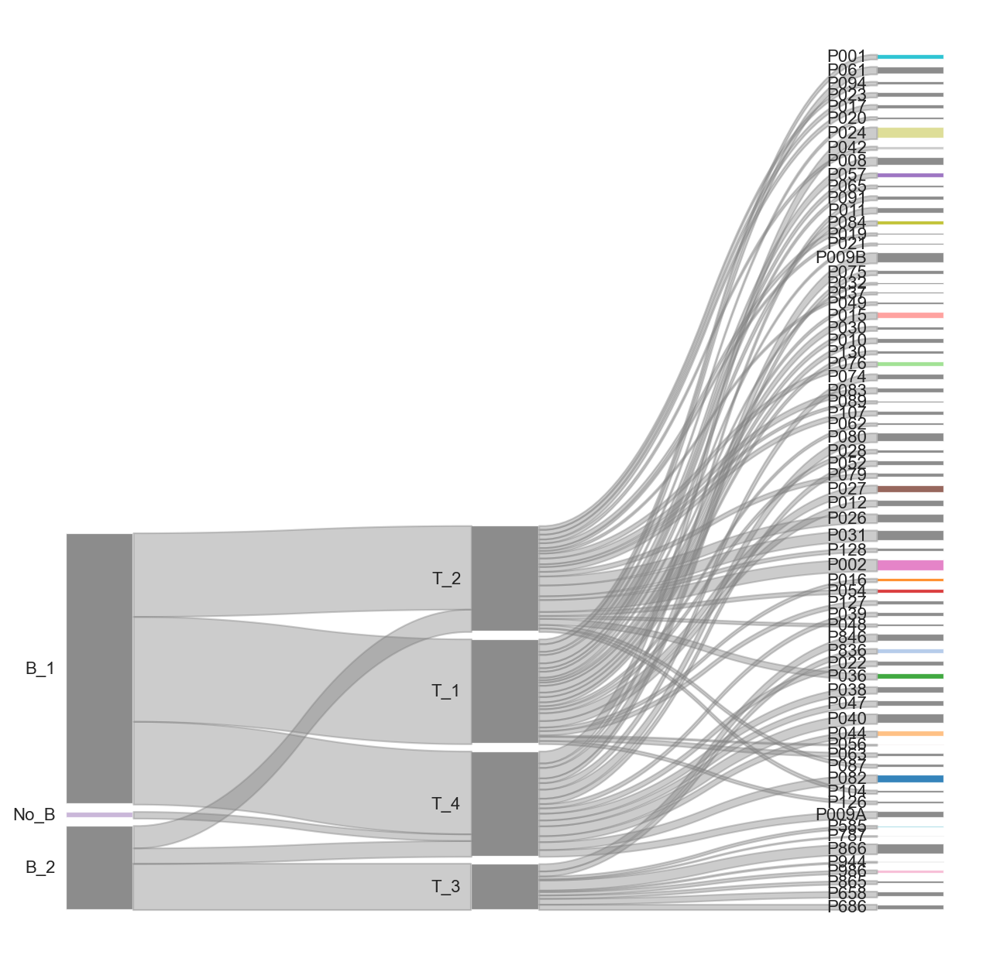

In [25]:
#pySnakey2 package
# for multilayer dataframe
import matplotlib.pyplot as plt
import pandas as pd
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf
from pysankey2 import Sankey

df_1 = df[['B_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_B_group_Tcell_group_comparison.pdf", bbox_inches="tight", dpi=300)

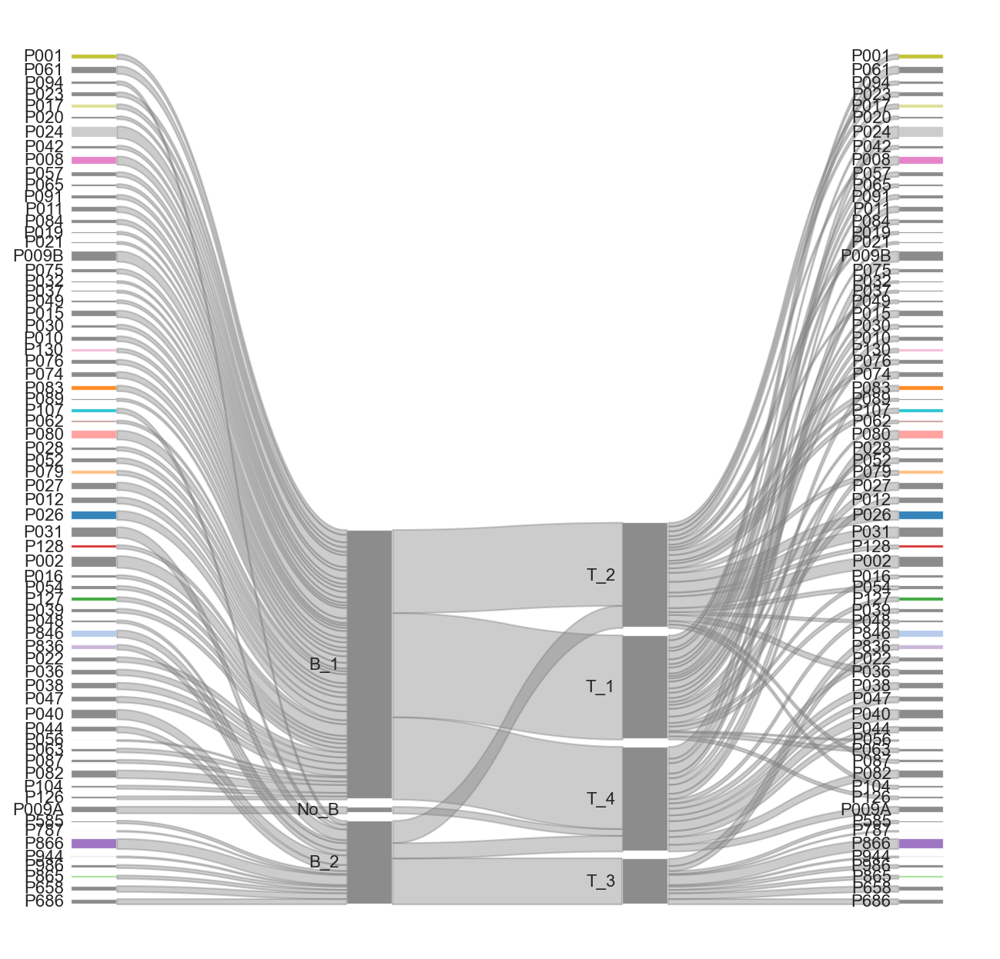

In [43]:
df_1 = df[['patient','B_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_B_group_Tcell_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

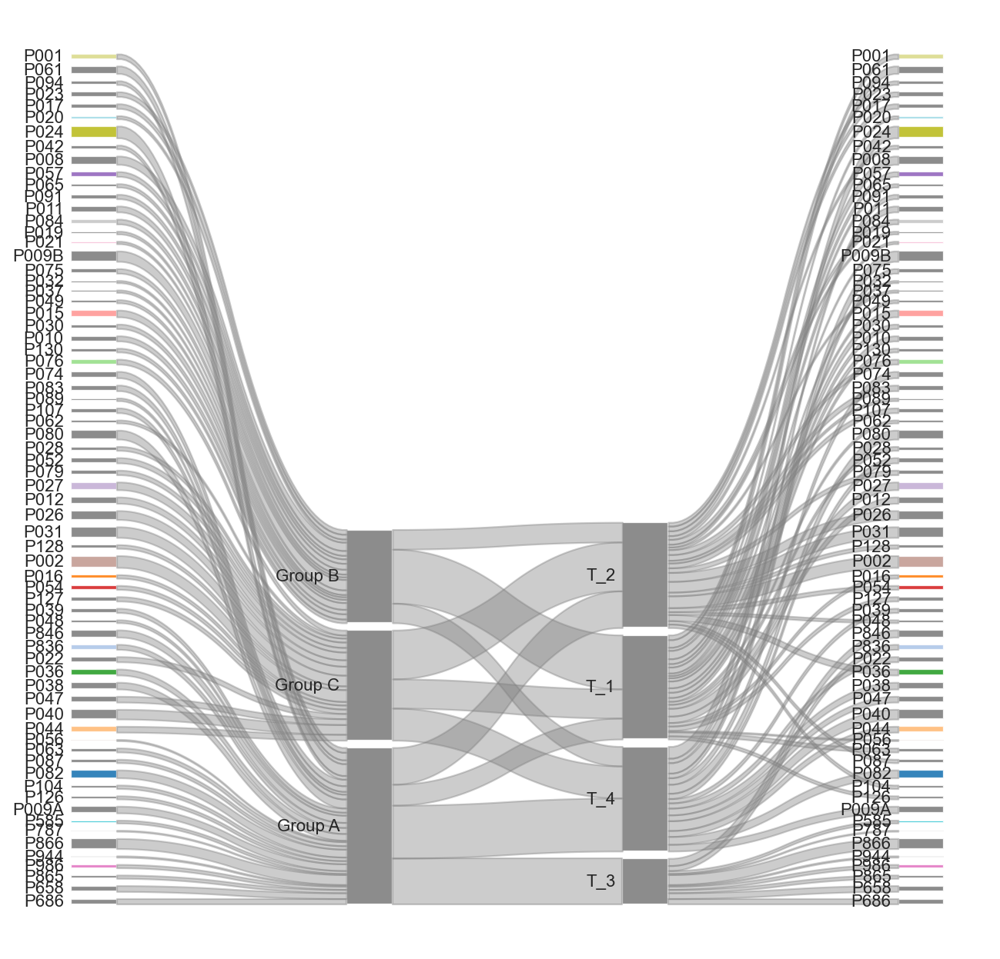

In [26]:
df_1 = df[['patient','patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_tumor_group_Tcell_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

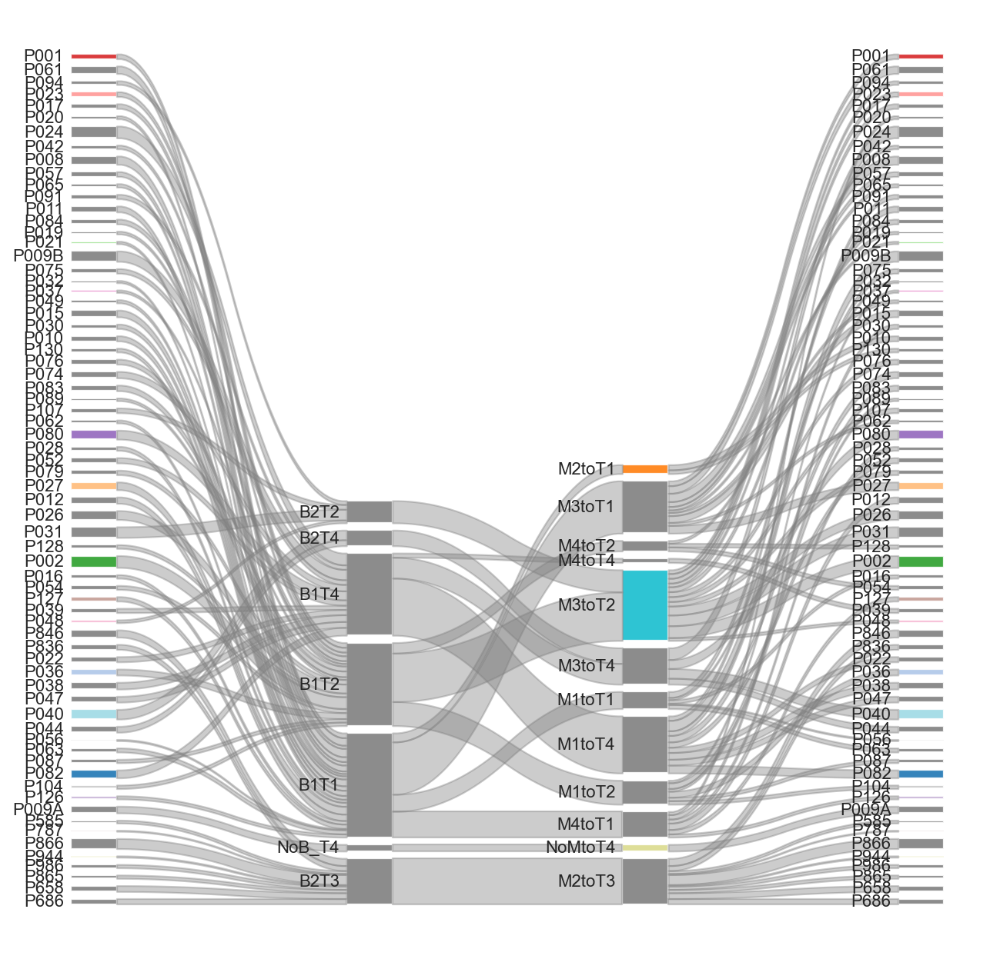

In [27]:
df_1 = df[['patient','B_T_patient_cluster','Myeloid_to_T_cluster44','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("paitent_B_T_group_Myeloid_T_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

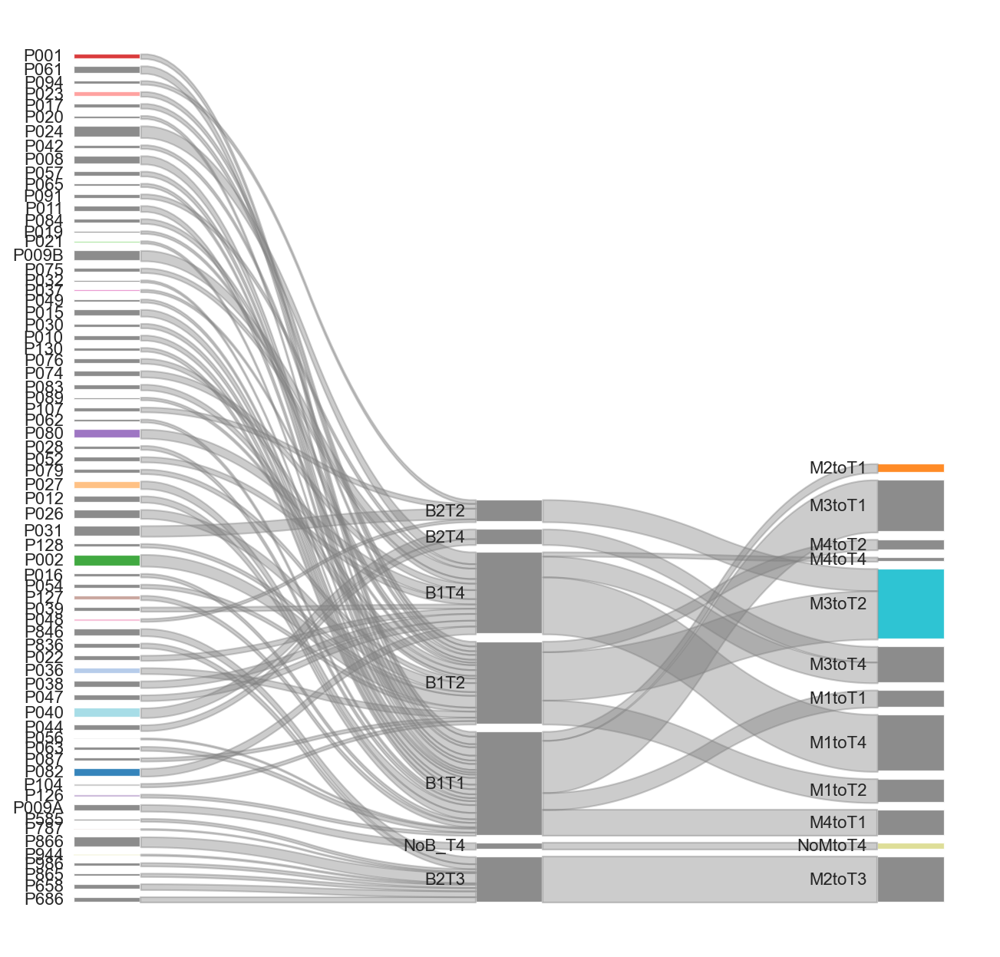

In [28]:
df_1 = df[['patient','B_T_patient_cluster','Myeloid_to_T_cluster44']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("paitent_B_T_group_Myeloid_T_group_comparison.pdf", bbox_inches="tight", dpi=300)

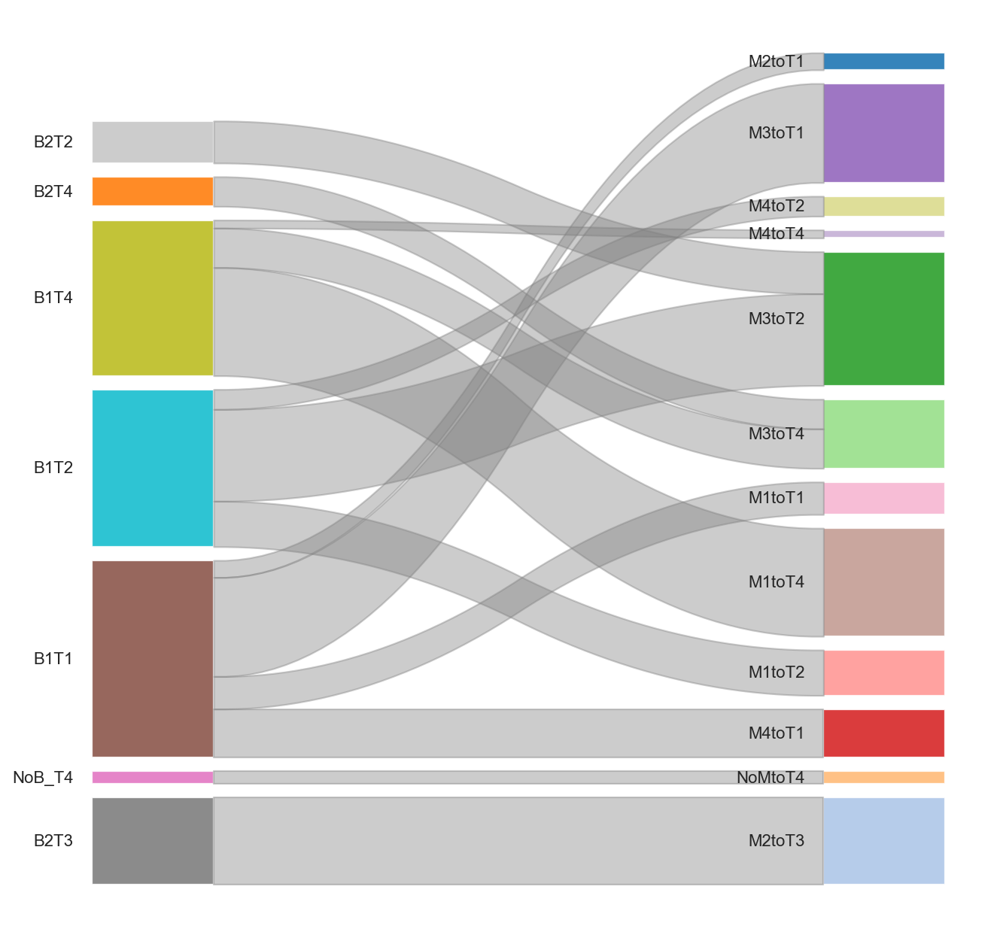

In [29]:
df_1 = df[['B_T_patient_cluster','Myeloid_to_T_cluster44']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("B_T_group_Myeloid_T_group_comparison_T_cells.pdf", bbox_inches="tight", dpi=300)

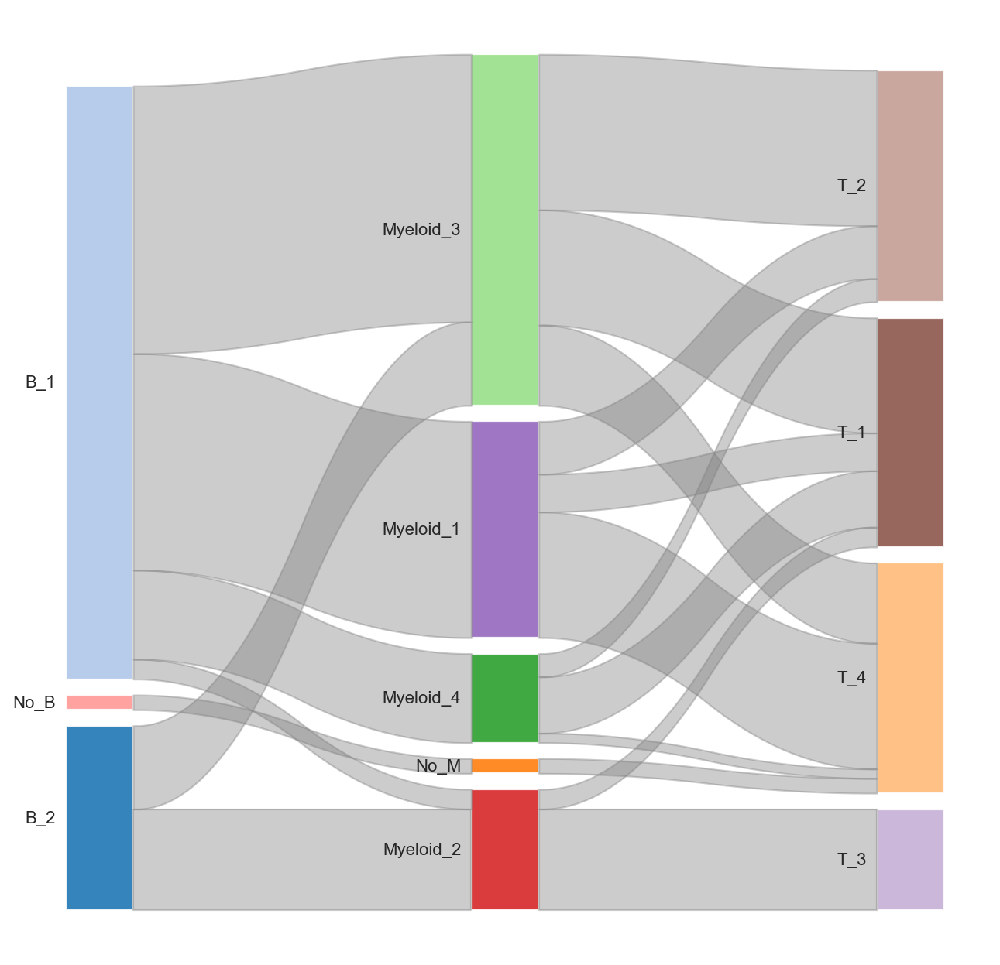

In [32]:
df_1 = df[['B_patient_cluster','Myeloid_patient_cluster4','T_patient_cluster4']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("B_Myeloid_T_group_in_T_cells.pdf", bbox_inches="tight", dpi=300)

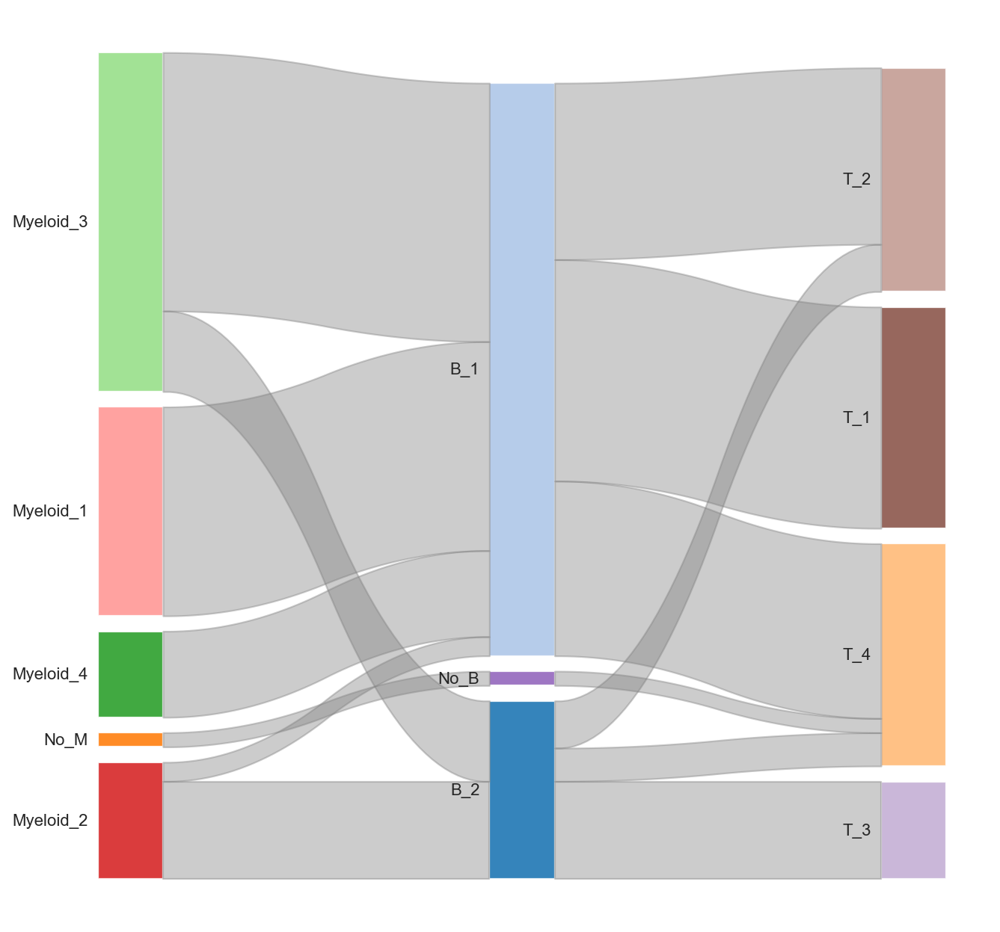

In [30]:
df_1 = df[['Myeloid_patient_cluster4','B_patient_cluster','T_patient_cluster4']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("B_Myeloid_T_group_in_T_cells_1.pdf", bbox_inches="tight", dpi=300)

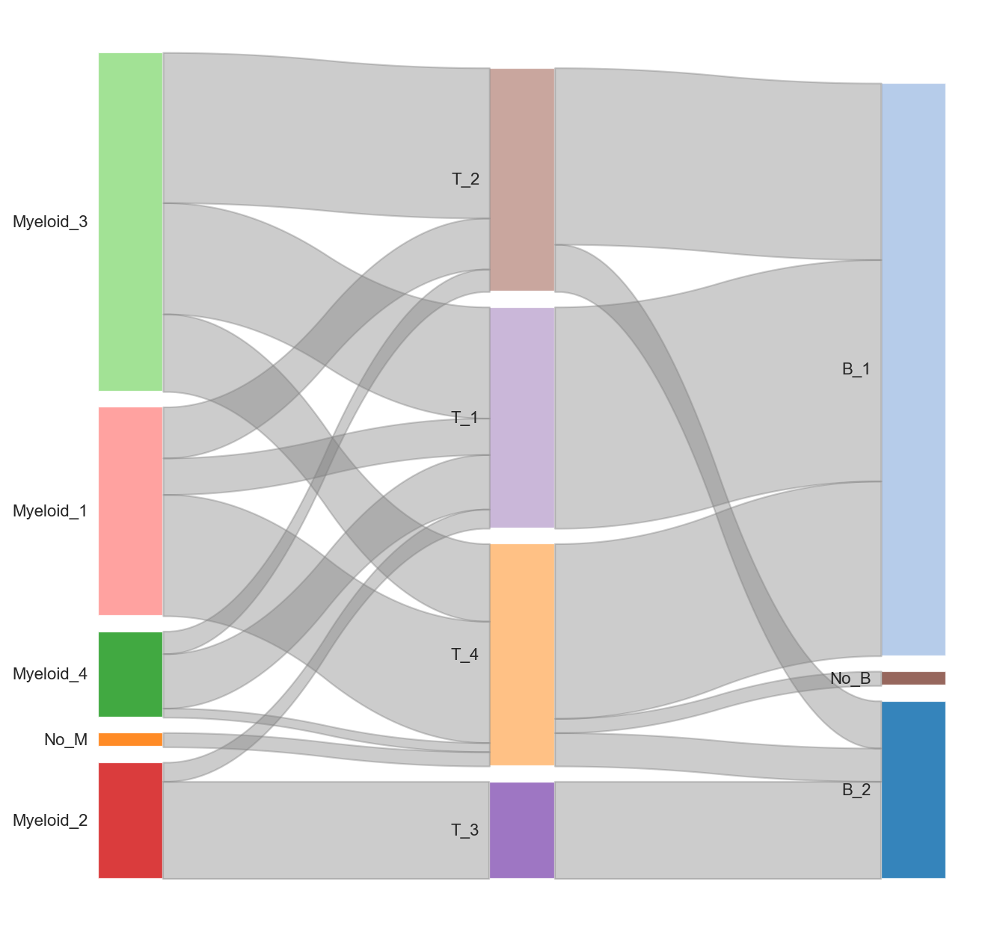

In [31]:
df_1 = df[['Myeloid_patient_cluster4','T_patient_cluster4','B_patient_cluster']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("B_Myeloid_T_group_in_T_cells_2.pdf", bbox_inches="tight", dpi=300)